# Cipla Data-Scientist Hiring Challenge

**Predict the loan sanction amount**

Buying a house requires a lot of careful planning. Once you have finalized your budget and the house that you want a buy, you must ensure that you have sufficient funds to pay the seller.

with rising property rates, most people avail home loans to buy their dream houses. The bank only lends up to $80%$ of the total amount based on a person's finance (salary, outgoing expenses, existing loans, etc.). You will need to make the rest of the payment yourself after the bank tells you how much they can lend.

**Task**

You work for xyz bank. Predict the loan amount that can be sanctioned to customers who applied for a home loan using the feature provided in the dataset.

**Data description**

The dataset folder contains the following:

- train.csv (30000, 24)
- test.csv (20000, 23)
- *sample_submission.csv* (5, 2)

The columns in the dataset are as follows:

- Customer ID -> A unique identification number of a customer
- Name -> Name of a customer
- Gender -> Gender of a customer
- Age -> Age of a customer
- Income(USD) -> Income of a customer 
- Income Stability -> A customer has a stable source of income
- Profession -> Profession a customer 
- Type of Employment -> Represents the type of employment of a customer
- Location -> The current location that a customer resides
- Loan Amount Request -> The loan amount requested by a customer (USD)
- Current Loan Expenses -> If a customer has any current active loans, then this represents the amount that a customer spends on these loans (monthly)
- Expense Type 1 -> A type of expense that a customer spends on (monthly)
- Expense Type 2 -> A type of expense that a customer spends on (monthly)
- Dependents -> A customer has any dependencies (spouse, parents, siblings, children, etc.)
- Credit Score -> The credit score of a customer
- No of Defaults -> The number of time a customer has defaulted
- Has Active Credit Card -> A customer has any active credit cards or not
- Property ID -> An identification number of a property
- Property Age -> The age of a property
- Property Type -> The type of property
- Property Location -> The location of a property
- Co-Applicant -> Whether a customer has co-applicants
- Property Price -> The selling price of a property
- Loan Sanction Amount (USD) -> The loan sanctioned amount for a customer

## Import Dataset

In [1]:
# Import all useful libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
%matplotlib inline
plt.style.use('dark_background')

In [2]:
# Import training datasets
df = pd.read_csv('train.csv')

In [3]:
# Check dataframe information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 24 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Customer ID                  30000 non-null  object 
 1   Name                         30000 non-null  object 
 2   Gender                       29947 non-null  object 
 3   Age                          30000 non-null  int64  
 4   Income (USD)                 25424 non-null  float64
 5   Income Stability             28317 non-null  object 
 6   Profession                   30000 non-null  object 
 7   Type of Employment           22730 non-null  object 
 8   Location                     30000 non-null  object 
 9   Loan Amount Request (USD)    30000 non-null  float64
 10  Current Loan Expenses (USD)  29828 non-null  float64
 11  Expense Type 1               30000 non-null  object 
 12  Expense Type 2               30000 non-null  object 
 13  Dependents      

In [4]:
# Print dataframe first 5 rows
df.head().T

,0,1,2,3,4
Customer ID,C-36995,C-33999,C-3770,C-26480,C-23459
Name,Frederica Shealy,America Calderone,Rosetta Verne,Zoe Chitty,Afton Venema
Gender,F,M,F,F,F
Age,56,32,65,65,31
Income (USD),1933.05,4952.91,988.19,NaN,2614.77
Income Stability,Low,Low,High,High,Low
Profession,Working,Working,Pensioner,Pensioner,Working
Type of Employment,Sales staff,NaN,NaN,NaN,High skill tech staff
Location,Semi-Urban,Semi-Urban,Semi-Urban,Rural,Semi-Urban
Loan Amount Request (USD),72809.58,46837.47,45593.04,80057.92,113858.89


## Check all Categorical columns is directly affected to the target column or not.

> Note: In this data-frame target column is `'Loan Sanction Amount (USD)'`.

M    15053
F    14894
Name: Gender, dtype: int64

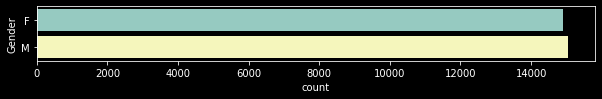

In [5]:
# how many different type group of gender apply for loan
plt.figure(figsize=(10, 1))
sns.countplot(y=df['Gender']);
plt.savefig('fig/Gender Countplot.svg')
df['Gender'].value_counts()

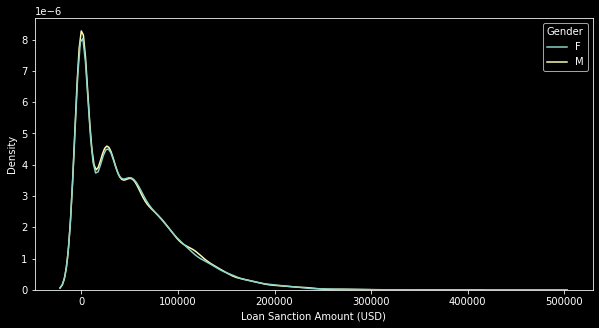

In [6]:
# Check gender is durectly affect to the 'Loan Sanction Amount'
plt.figure(figsize=(10, 5))
sns.kdeplot(x=df['Loan Sanction Amount (USD)'], hue=df['Gender']);
plt.savefig('fig/Gender.svg')

> Note: In this density plot we can easily see that in `Gender` column **"Male"** and **"Female"** has same relation to target column so we can drop this column in model_run.

18    4378
19     482
20     499
21     510
22     469
23     520
24     503
25     470
26     513
27     511
28     517
29     492
30     501
31     480
32     492
33     491
34     518
35     476
36     495
37     478
38     509
39     502
40     458
41     514
42     508
43     492
44     523
45     519
46     484
47     536
48     489
49     458
50     515
51     482
52     484
53     507
54     462
55     493
56     507
57     538
58     514
59     492
60     774
61     787
62     784
63     712
64     813
65    1349
Name: Age, dtype: int64

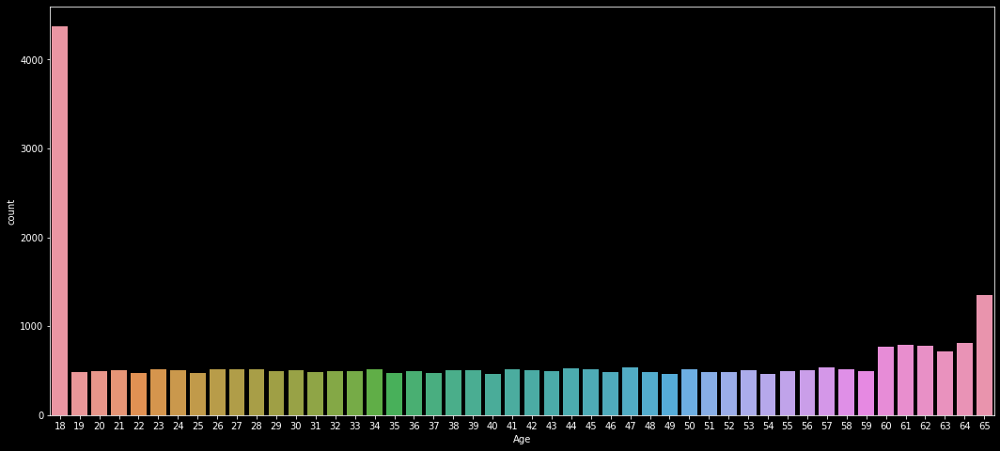

In [7]:
# How many different age of group is applied for loan
plt.figure(figsize=(18, 8))
sns.countplot(x=df['Age'])
plt.savefig('fig/Age_Countplot.svg')
df['Age'].value_counts().sort_index()

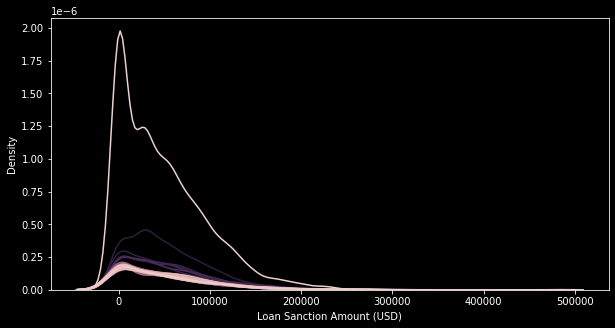

In [8]:
# Check age id directly affected to the target column
plt.figure(figsize=(10, 5))
sns.kdeplot(data=df, x='Loan Sanction Amount (USD)', hue='Age', legend=False);
plt.savefig('fig/Age.svg')

Low     25751
High     2566
Name: Income Stability, dtype: int64

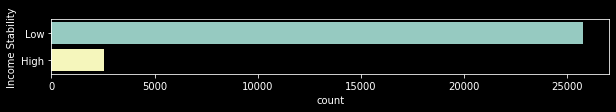

In [9]:
# Count Income Stability
plt.figure(figsize=(10, 1))
sns.countplot(y=df['Income Stability']);
plt.savefig('fig/Income stability countplot.svg')
df['Income Stability'].value_counts()

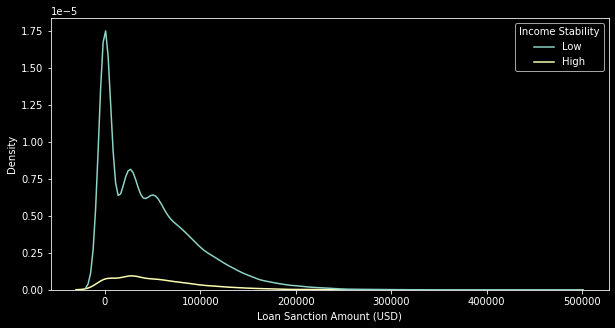

In [10]:
# Check Income Stability is directly affects to target column
plt.figure(figsize=(10, 5))
sns.kdeplot(data=df, x='Loan Sanction Amount (USD)', hue='Income Stability');
plt.savefig('fig/Income_Satbility.svg')

Working                 16926
Commercial associate     7962
Pensioner                2740
State servant            2366
Businessman                 2
Unemployed                  2
Maternity leave             1
Student                     1
Name: Profession, dtype: int64

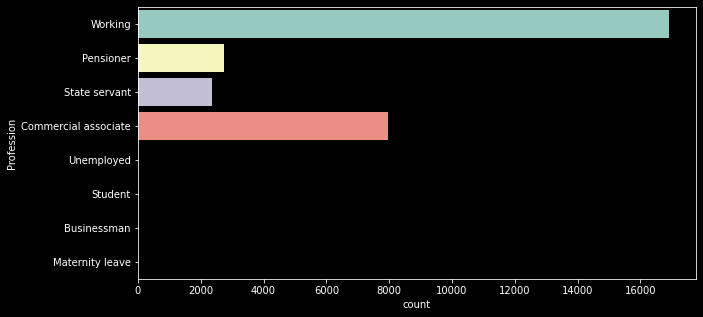

In [11]:
# How many Customer Profession
plt.figure(figsize=(10, 5))
sns.countplot(y=df['Profession']);
plt.savefig('fig/profession countplot.svg')
df['Profession'].value_counts()

c:\program files\python39\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
c:\program files\python39\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


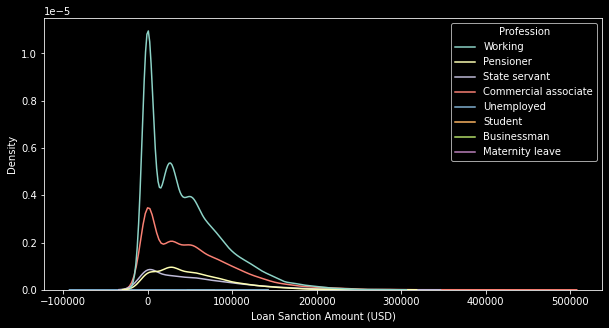

In [12]:
# Check customer profession is directly affects to target column
plt.figure(figsize=(10, 5))
sns.kdeplot(data=df, x='Loan Sanction Amount (USD)', hue='Profession');
plt.savefig('fig/Profession.svg')

Laborers                 5578
Sales staff              3736
Core staff               3230
Managers                 2495
Drivers                  1606
Accountants              1379
High skill tech staff    1307
Medicine staff            864
Security staff            579
Cooking staff             566
Private service staff     342
Cleaning staff            341
Low-skill Laborers        162
Secretaries               161
Waiters/barmen staff      149
Realty agents              86
IT staff                   77
HR staff                   72
Name: Type of Employment, dtype: int64

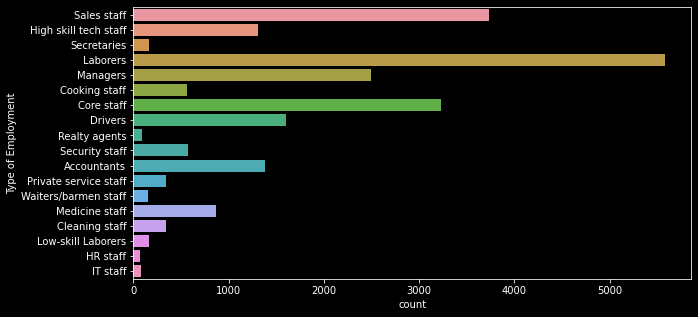

In [13]:
# How many type of employments
plt.figure(figsize=(10, 5))
sns.countplot(y=df['Type of Employment']);
plt.savefig('fig/Type of employment countplot.svg')
df['Type of Employment'].value_counts()

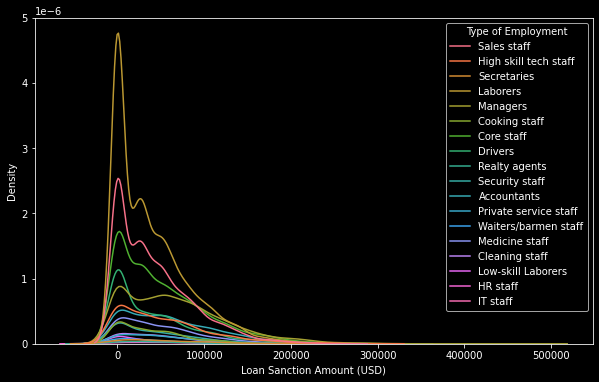

In [14]:
# Check type of employment is directly affects to target column
plt.figure(figsize=(10, 6))
sns.kdeplot(x=df['Loan Sanction Amount (USD)'], hue=df['Type of Employment']);
plt.savefig('fig/Type of employment.svg')

Semi-Urban    21563
Rural          5338
Urban          3099
Name: Location, dtype: int64

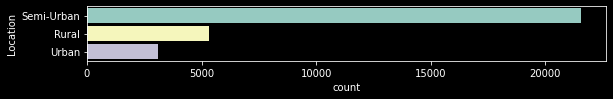

In [15]:
# How many different type of location
plt.figure(figsize=(9.3, 1))
sns.countplot(y=df['Location']);
plt.savefig('fig/Location countplot.svg')
df['Location'].value_counts()

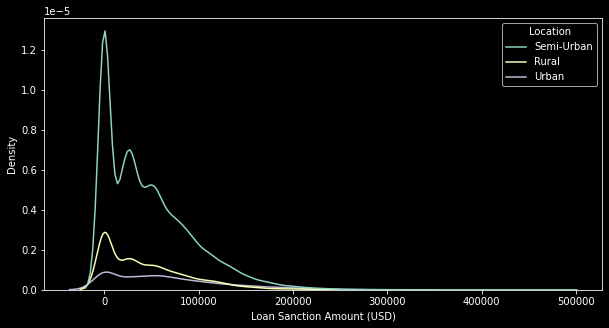

In [16]:
# Check customer Location is directly affects to target column
plt.figure(figsize=(10, 5))
sns.kdeplot(x=df['Loan Sanction Amount (USD)'], hue=df['Location']);
plt.savefig('fig/Location.svg')

N    19214
Y    10786
Name: Expense Type 1, dtype: int64

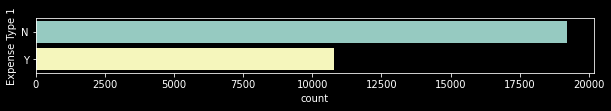

In [17]:
plt.figure(figsize=(10, 1))
sns.countplot(y=df['Expense Type 1']);
plt.savefig('fig/Expense Type 1 countplot.svg')
df['Expense Type 1'].value_counts()

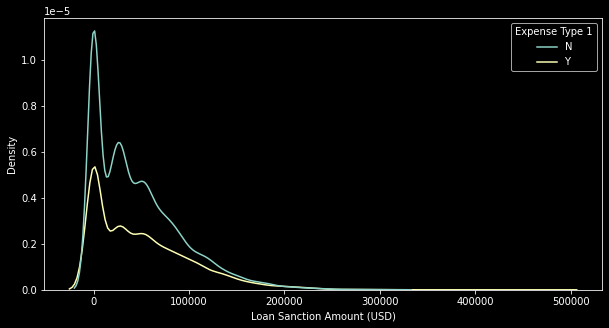

In [18]:
# Check Expense Type 1 is directly affecte to the target column
plt.figure(figsize=(10, 5))
sns.kdeplot(x=df['Loan Sanction Amount (USD)'], hue=df['Expense Type 1']);
plt.savefig('fig/Expense Type 1.svg')

Y    20180
N     9820
Name: Expense Type 2, dtype: int64

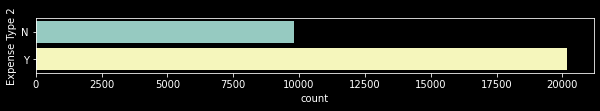

In [19]:
plt.figure(figsize=(10, 1))
sns.countplot(y=df['Expense Type 2']);
plt.savefig('fig/Expense Type 2 countplot.svg')
df['Expense Type 2'].value_counts()

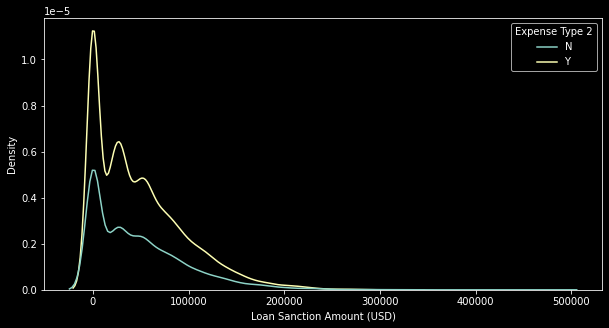

In [20]:
# Check Expense Type 2 is directly affecte to the target column
plt.figure(figsize=(10, 5))
sns.kdeplot(x=df['Loan Sanction Amount (USD)'], hue=df['Expense Type 2']);
plt.savefig('fig/Expense Type 2.svg')

> Note: As per KDE plot `Expense Type 1` & `Expense Type 2` are same density plot, so plot together and cross verifying... 

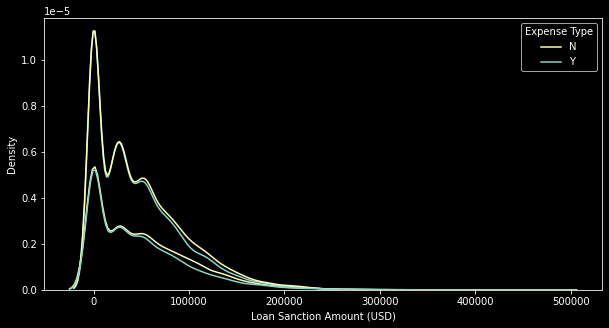

In [21]:
# PLot Expense Type 1 & Expense Type 2 together
plt.figure(figsize=(10, 5))
sns.kdeplot(x=df['Loan Sanction Amount (USD)'], hue=df['Expense Type 1'], legend=True, color=plt.cm.PiYG)
sns.kdeplot(x=df['Loan Sanction Amount (USD)'], hue=df['Expense Type 2'], legend=True, color=plt.cm.BuGn);
plt.legend(['N', 'Y'], title='Expense Type')
plt.savefig('fig/Comparision Expense Type 1 & 2.svg')

> Note: as we see that `Expense Type 1` & `Expense Type 2` are almost same density and opposite to each other in respect to target column so we can use any one of this column...

2.0     13108
3.0      5719
1.0      5544
4.0      2704
5.0       372
6.0        50
7.0         7
8.0         1
14.0        1
10.0        1
Name: Dependents, dtype: int64

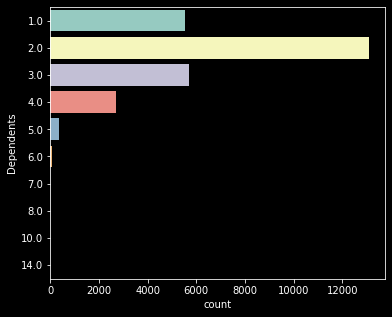

In [22]:
# The number of occurrences of Dependents.
plt.figure(figsize=(6, 5))
sns.countplot(y=df['Dependents']);
plt.savefig('fig/Dependents countplot.svg')
df['Dependents'].value_counts()

c:\program files\python39\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
c:\program files\python39\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
c:\program files\python39\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


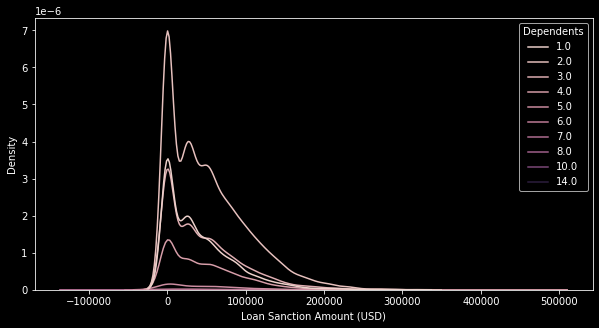

In [23]:
# Check Dependents is directly affected to the target column
plt.figure(figsize=(10, 5))
sns.kdeplot(x=df['Loan Sanction Amount (USD)'], hue=df['Dependents']);
plt.savefig('fig/Dependents.svg')

0    24182
1     5818
Name: No. of Defaults, dtype: int64

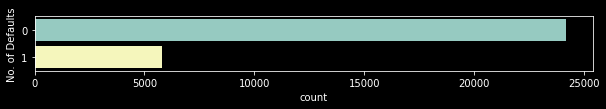

In [24]:
# Count No. of Defaults in form of yes(1) or no(0)
plt.figure(figsize=(10, 1))
sns.countplot(y=df['No. of Defaults']);
plt.savefig('fig/No. of Defults countplot.svg')
df['No. of Defaults'].value_counts()

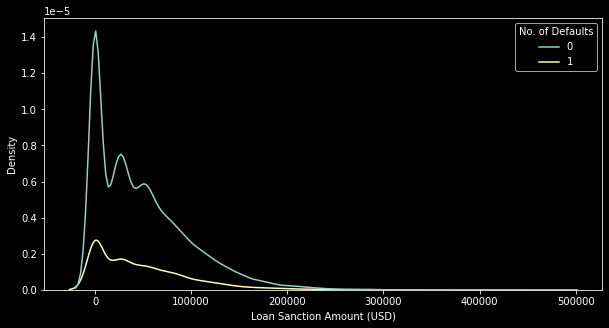

In [25]:
# Check no. of defaults is directly affected to the target column
plt.figure(figsize=(10, 5))
sns.kdeplot(x=df['Loan Sanction Amount (USD)'], hue=df['No. of Defaults']);
plt.savefig('fig/No. of Defults.svg')

Active         9771
Inactive       9466
Unpossessed    9197
Name: Has Active Credit Card, dtype: int64

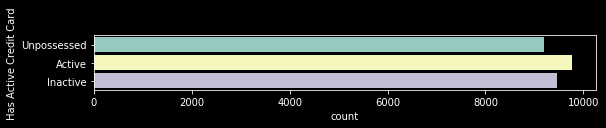

In [26]:
# How many credit card active, deactive and unprocessed
plt.figure(figsize=(9, 1))
sns.countplot(y=df['Has Active Credit Card']);
plt.savefig('fig/Has Active Credit Card countplot.svg')
df['Has Active Credit Card'].value_counts()

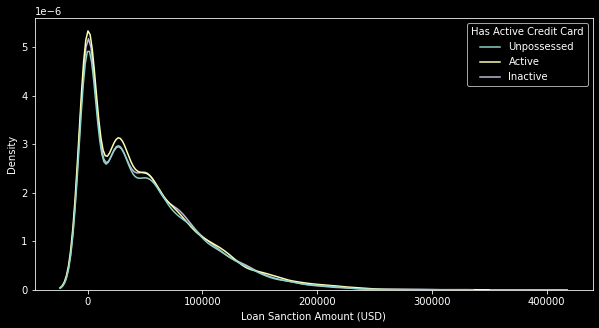

In [27]:
# Check credit card status is derectly affect to target column
plt.figure(figsize=(10, 5))
sns.kdeplot(x=df['Loan Sanction Amount (USD)'], hue=df['Has Active Credit Card']);
plt.savefig('fig/Has Active Credit Card.svg')

> Note: As we see that column `Has Active Credit Card` is not affecting to the target column that why drop this column. 

Semi-Urban    10387
Rural         10041
Urban          9216
Name: Property Location, dtype: int64

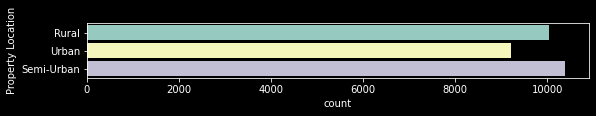

In [28]:
# Check no of property location
plt.figure(figsize=(9, 1))
sns.countplot(y=df['Property Location']);
plt.savefig('fig/Property Location countplot.svg')
df['Property Location'].value_counts()

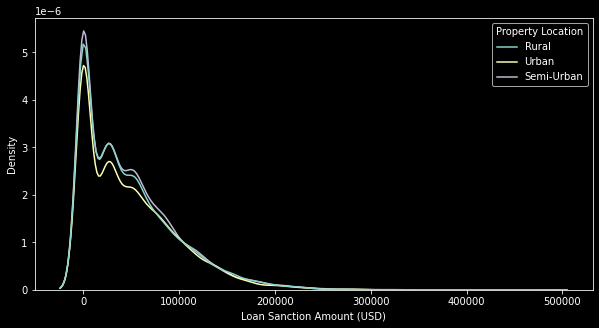

In [29]:
# Check property loacation is derectly affected to the target column
plt.figure(figsize=(10, 5))
sns.kdeplot(x=df['Loan Sanction Amount (USD)'], hue=df['Property Location']);
plt.savefig('fig/Property Location.svg')

> Note: In `Property Location` is as much correlated to the target column but we can use in model run.

 1      25516
 0       4316
-999      168
Name: Co-Applicant, dtype: int64

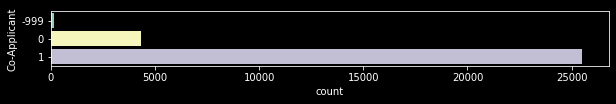

In [30]:
# Check Co-applicant is present(1) or not(0)
plt.figure(figsize=(10, 1))
sns.countplot(y=df['Co-Applicant']);
df['Co-Applicant'].value_counts()

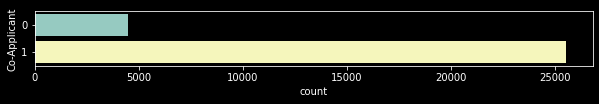

In [31]:
plt.figure(figsize=(10, 1))
sns.countplot(y=df['Co-Applicant'].replace(to_replace=-999, value=0));
plt.savefig('fig/Co-Applicant after -999 to 0 countplot.svg')

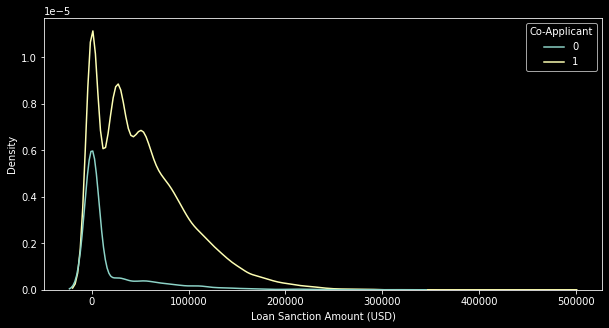

In [32]:
plt.figure(figsize=(10, 5))
sns.kdeplot(x=df['Loan Sanction Amount (USD)'], hue=df['Co-Applicant'].replace(to_replace=-999, value=0));
plt.savefig('fig/Co-Applicant.svg')

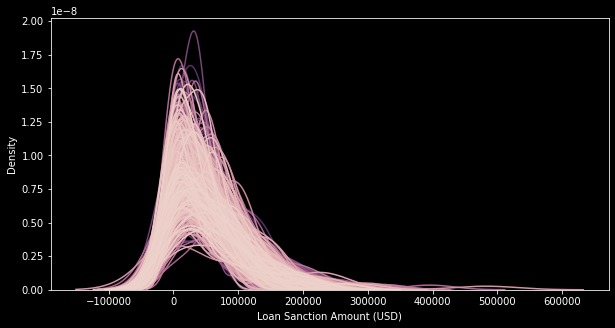

In [33]:
plt.figure(figsize=(10, 5))
sns.kdeplot(x=df['Loan Sanction Amount (USD)'], hue=df['Property ID'], legend=False);
plt.savefig('fig/Property ID.svg')

## Check all numeric columns is highly correlated to each other or not

In [34]:
# Find the numeric columns in dataset
for label, content in df.items():
    if pd.api.types.is_numeric_dtype(content):
        print(label)

Age
Income (USD)
Loan Amount Request (USD)
Current Loan Expenses (USD)
Dependents
Credit Score
No. of Defaults
Property ID
Property Age
Property Type
Co-Applicant
Property Price
Loan Sanction Amount (USD)


In [35]:
px.box(df['Income (USD)'], template='none')

In [36]:
df['Income (USD)'].max()

1777460.21

In [37]:
df['Income (USD)'].nlargest()

20965    1777460.21
6719      122966.28
26619      54653.75
15991      48095.16
29585      32726.98
Name: Income (USD), dtype: float64

<AxesSubplot:xlabel='Income (USD)', ylabel='Density'>

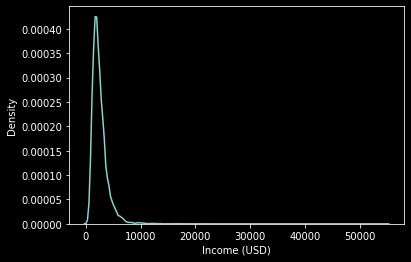

In [38]:
sns.kdeplot(x=df['Income (USD)'][df['Income (USD)'] < 122966.28])

In [39]:
px.box(df['Property Price'], template='none')

In [40]:
px.box(df['Loan Amount Request (USD)'], template='none')

In [41]:
px.box(df['Loan Sanction Amount (USD)'], template='none')

In [42]:
df['Loan Sanction Amount (USD)'][df['Loan Sanction Amount (USD)'] == -999]

22      -999.0
145     -999.0
250     -999.0
387     -999.0
484     -999.0
         ...  
29872   -999.0
29912   -999.0
29932   -999.0
29934   -999.0
29942   -999.0
Name: Loan Sanction Amount (USD), Length: 338, dtype: float64

In [43]:
# Now check this all numeric columns highly-corelated to each other or not
def correlation_check(data):
    col_list = []
    for col_1 in data.columns:
        if pd.api.types.is_numeric_dtype(data[col_1]):
            for col_2 in data.columns:
                if pd.api.types.is_numeric_dtype(data[col_2]):
                    if col_1 != col_2 and (col_1 not in col_list):
                        if abs(data[col_1].corr(data[col_2])) > 0.70:
                            col_list.append(col_2)
                            print(f'"{col_1}" is highly correleted with "{col_2}" = {data[col_1].corr(data[col_2])}')

In [44]:
correlation_check(df)

"Income (USD)" is highly correleted with "Property Age" = 1.0
"Loan Amount Request (USD)" is highly correleted with "Property Price" = 0.948349702622957
"Loan Amount Request (USD)" is highly correleted with "Loan Sanction Amount (USD)" = 0.7264077750967236


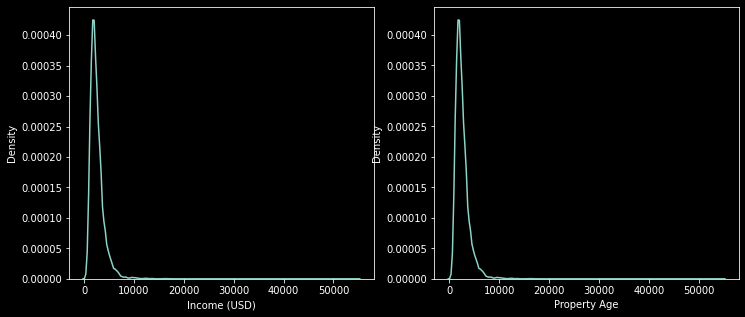

In [45]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.kdeplot(df['Income (USD)'][df['Income (USD)'] < 122966.28])
plt.subplot(1, 2, 2)
sns.kdeplot(df['Property Age'][df['Property Age'] < 122966.28]);
df['Income (USD)'].corr(df['Property Age'])
plt.savefig('fig/Income & Property Age correlation 1.svg')

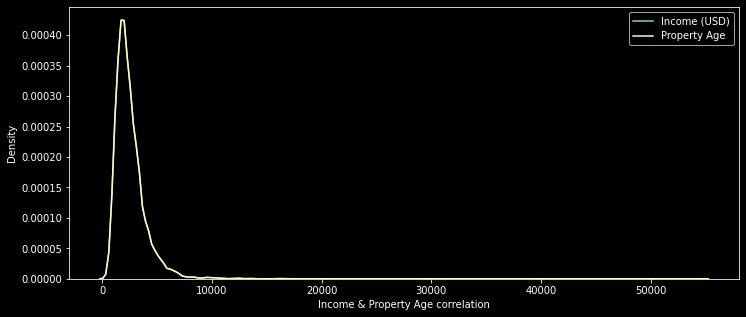

In [46]:
plt.figure(figsize=(12, 5))
# plt.subplot(1, 2, 1)
sns.kdeplot(df['Income (USD)'][df['Income (USD)'] < 122966.28])
# plt.subplot(1, 2, 2)
sns.kdeplot(df['Property Age'][df['Property Age'] < 122966.28]);
df['Income (USD)'].corr(df['Property Age'])
plt.legend(['Income (USD)', 'Property Age'])
plt.xlabel('Income & Property Age correlation')
plt.savefig('fig/Income & Property Age correlation 2.svg')

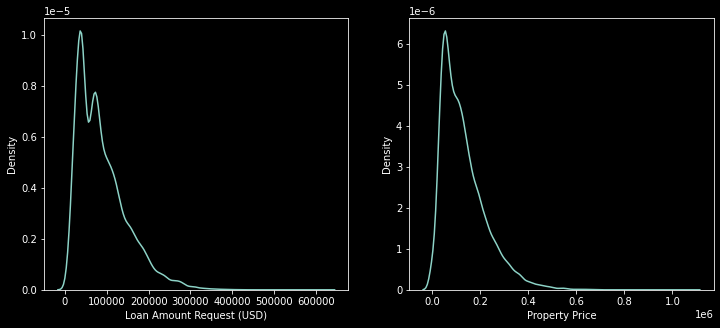

In [47]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.kdeplot(df['Loan Amount Request (USD)'])
plt.subplot(1, 2, 2)
sns.kdeplot(df['Property Price']);
df['Loan Amount Request (USD)'].corr(df['Property Price'])
plt.savefig('fig/Loan Amount Request & Property Price correlation 1.svg')

0.948349702622957

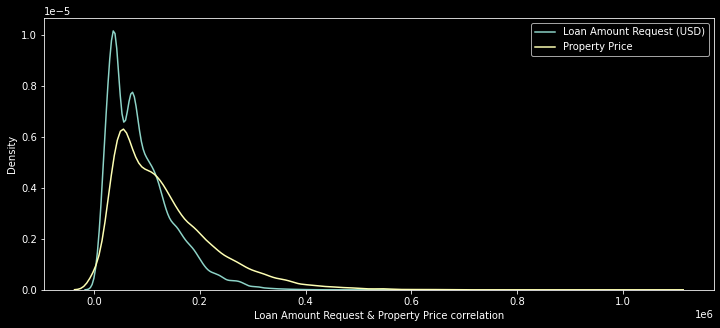

In [48]:
plt.figure(figsize=(12, 5))
# plt.subplot(1, 2, 1)
sns.kdeplot(df['Loan Amount Request (USD)'])
# plt.subplot(1, 2, 2)
sns.kdeplot(df['Property Price']);
plt.legend(['Loan Amount Request (USD)', 'Property Price'])
plt.xlabel('Loan Amount Request & Property Price correlation')
plt.savefig('fig/Loan Amount Request & Property Price correlation 2.svg')
df['Loan Amount Request (USD)'].corr(df['Property Price'])

## As per visualization drop columns

In [5]:
df.columns

Index(['Customer ID', 'Name', 'Gender', 'Age', 'Income (USD)',
       'Income Stability', 'Profession', 'Type of Employment', 'Location',
       'Loan Amount Request (USD)', 'Current Loan Expenses (USD)',
       'Expense Type 1', 'Expense Type 2', 'Dependents', 'Credit Score',
       'No. of Defaults', 'Has Active Credit Card', 'Property ID',
       'Property Age', 'Property Type', 'Property Location', 'Co-Applicant',
       'Property Price', 'Loan Sanction Amount (USD)'],
      dtype='object')

In [6]:
df_train = df.copy()

In [7]:
for label, content in df_train.items():
    if -999 in list(content):
        print(f'{label} = {len(df[label][df[label] == -999])}')

Current Loan Expenses (USD) = 177
Co-Applicant = 168
Property Price = 352
Loan Sanction Amount (USD) = 338


In [8]:
for label, content in df_train.items():
    if -999 in list(content):
        df[label][df[label] == -999] = 0

In [9]:
df_train.drop(columns=['Customer ID', 'Name', 'Gender', 'Expense Type 2', 'Has Active Credit Card', 
                       'Property Age', 'Property Location'], inplace=True)

In [10]:
df_train

,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Dependents,Credit Score,No. of Defaults,Property ID,Property Type,Co-Applicant,Property Price,Loan Sanction Amount (USD)
0,56,1933.05,Low,Working,Sales staff,Semi-Urban,72809.58,241.08,N,3.0,809.44,0,746,4,1,119933.46,54607.18
1,32,4952.91,Low,Working,NaN,Semi-Urban,46837.47,495.81,N,1.0,780.40,0,608,2,1,54791.00,37469.98
2,65,988.19,High,Pensioner,NaN,Semi-Urban,45593.04,171.95,N,1.0,833.15,0,546,2,0,72440.58,36474.43
3,65,NaN,High,Pensioner,NaN,Rural,80057.92,298.54,N,2.0,832.70,1,890,2,1,121441.51,56040.54
4,31,2614.77,Low,Working,High skill tech staff,Semi-Urban,113858.89,491.41,N,NaN,745.55,1,715,4,1,208567.91,74008.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,38,4969.41,Low,Commercial associate,Managers,Urban,76657.90,722.34,Y,2.0,869.61,0,566,4,1,111096.56,68992.11
29996,20,1606.88,Low,Working,Laborers,Semi-Urban,66595.14,253.04,N,3.0,729.41,0,175,3,1,73453.94,46616.60
29997,49,NaN,Low,Working,Sales staff,Urban,81410.08,583.11,N,NaN,NaN,0,959,1,1,102108.02,61057.56
29998,38,2417.71,Low,Working,Security staff,Semi-Urban,142524.10,378.29,N,3.0,677.27,1,375,4,1,168194.47,99766.87


## Fill null value

In [11]:
df_train.isna().sum()

Age                               0
Income (USD)                   4576
Income Stability               1683
Profession                        0
Type of Employment             7270
Location                          0
Loan Amount Request (USD)         0
Current Loan Expenses (USD)     172
Expense Type 1                    0
Dependents                     2493
Credit Score                   1703
No. of Defaults                   0
Property ID                       0
Property Type                     0
Co-Applicant                      0
Property Price                    0
Loan Sanction Amount (USD)      340
dtype: int64

In [12]:
df_train['Loan Sanction Amount (USD)'].fillna(value=0, inplace=True)

In [13]:
# Split into x and y
x = df_train.drop(columns='Loan Sanction Amount (USD)')
y = df_train['Loan Sanction Amount (USD)']

x.shape, y.shape

((30000, 16), (30000,))

In [14]:
def fill_value(data, fillvalue=0):
    
    '''
    data = dataframe name
    fillvalue = fill null values in numeric columns {'mean', 'median', 0}
                'mean' = filled by mean values in that perticular column
                'median' = filled by median values in that perticular column
                0 = filled by 0(zero) which is default value
    '''
    
    # for numeric columns
    for label, content in data.items():
        if pd.api.types.is_numeric_dtype(content):
            # Add Binary column to indicate wherether missing values is present or not
            data[label+'_is_missing'] = pd.isnull(content)
            if pd.isnull(content).sum():
                # Fill null values
                if fillvalue=='mean':
                    data[label] = content.fillna(content.mean())
                elif fillvalue=='median':
                    data[label] = content.fillna(content.median())
                else:
                    data[label].fillna(value=0, inplace=True)
                
    # for string columns
    for label, content in data.items():
        if pd.api.types.is_string_dtype(content):
            # Add Binary column to indicate wherether missing values is present or not
            data[label+'_is_missing'] = pd.isnull(content)
            # Turn into categorical dtype
            data[label] = content.astype('category').cat.as_ordered()
            # Turn into numeric type and add +1
            data[label] = pd.Categorical(content).codes + 1

In [15]:
# Fill Null values in features columns (x)
fill_value(x, 'median')
x.isna().sum()

Age                                       0
Income (USD)                              0
Income Stability                          0
Profession                                0
Type of Employment                        0
Location                                  0
Loan Amount Request (USD)                 0
Current Loan Expenses (USD)               0
Expense Type 1                            0
Dependents                                0
Credit Score                              0
No. of Defaults                           0
Property ID                               0
Property Type                             0
Co-Applicant                              0
Property Price                            0
Age_is_missing                            0
Income (USD)_is_missing                   0
Loan Amount Request (USD)_is_missing      0
Current Loan Expenses (USD)_is_missing    0
Dependents_is_missing                     0
Credit Score_is_missing                   0
No. of Defaults_is_missing      

In [16]:
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 32 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Age                                     30000 non-null  int64  
 1   Income (USD)                            30000 non-null  float64
 2   Income Stability                        30000 non-null  int8   
 3   Profession                              30000 non-null  int8   
 4   Type of Employment                      30000 non-null  int8   
 5   Location                                30000 non-null  int8   
 6   Loan Amount Request (USD)               30000 non-null  float64
 7   Current Loan Expenses (USD)             30000 non-null  float64
 8   Expense Type 1                          30000 non-null  int8   
 9   Dependents                              30000 non-null  float64
 10  Credit Score                            30000 non-null  fl

In [17]:
correlation_check(x)

NameError: name 'correlation_check' is not defined

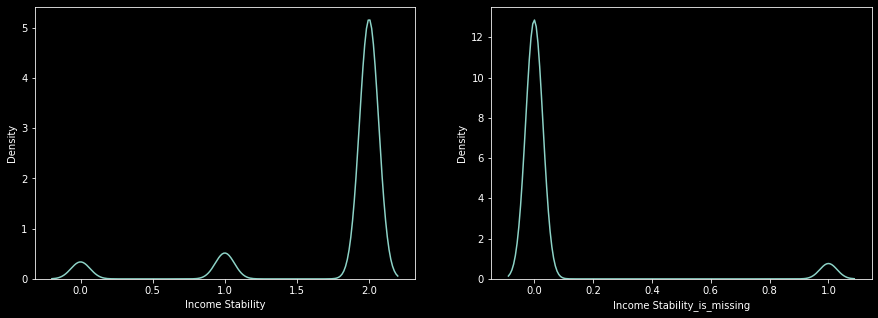

In [120]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.kdeplot(x['Income Stability'])
plt.subplot(1, 2, 2)
sns.kdeplot(x['Income Stability_is_missing']);
x['Income Stability'].corr(x['Income Stability_is_missing'])
plt.savefig('fig/income satbility & income stability_is_missing correlation 1.svg')

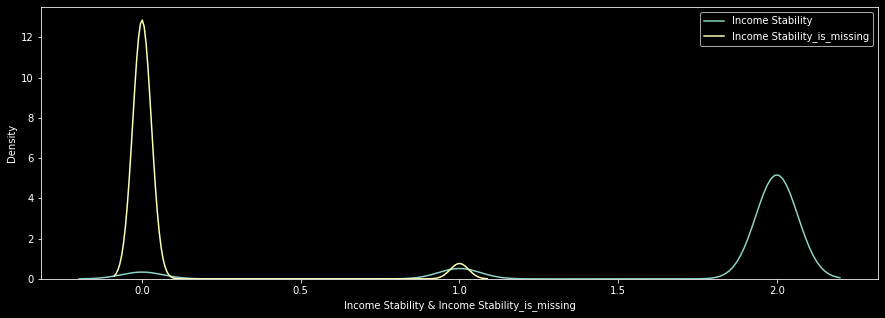

In [121]:
plt.figure(figsize=(15, 5))
# plt.subplot(1, 2, 1)
sns.kdeplot(x['Income Stability'])
# plt.subplot(1, 2, 2)
sns.kdeplot(x['Income Stability_is_missing'])
plt.legend(['Income Stability', 'Income Stability_is_missing'])
plt.xlabel('Income Stability & Income Stability_is_missing');
x['Income Stability'].corr(x['Income Stability_is_missing']), x['Income Stability_is_missing'].corr(x['Income Stability'])
plt.savefig('fig/income satbility & income stability_is_missing correlation 2.svg')

0.948349702622957

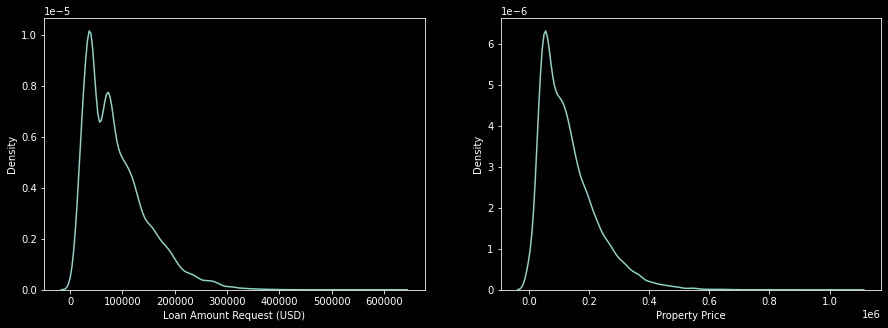

In [122]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.kdeplot(x['Loan Amount Request (USD)'])
plt.subplot(1, 2, 2)
sns.kdeplot(x['Property Price']);
x['Loan Amount Request (USD)'].corr(x['Property Price'])

(0.948349702622957, 0.948349702622957)

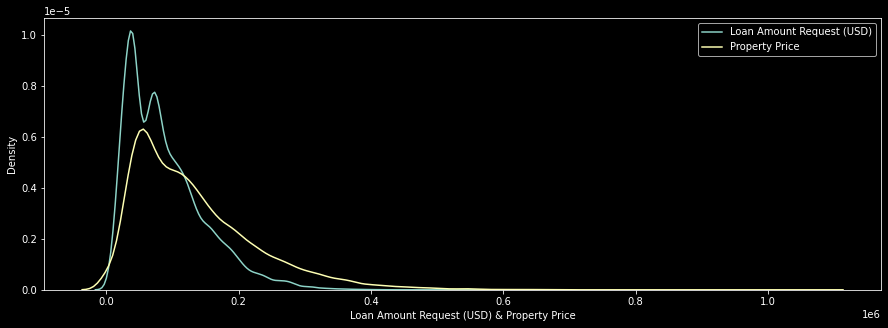

In [64]:
plt.figure(figsize=(15, 5))
# plt.subplot(1, 2, 1)
sns.kdeplot(x['Loan Amount Request (USD)'])
# plt.subplot(1, 2, 2)
sns.kdeplot(x['Property Price'])
plt.legend(['Loan Amount Request (USD)', 'Property Price'])
plt.xlabel('Loan Amount Request (USD) & Property Price');
x['Loan Amount Request (USD)'].corr(x['Property Price']), x['Property Price'].corr(x['Loan Amount Request (USD)'])

-0.9254610513614733

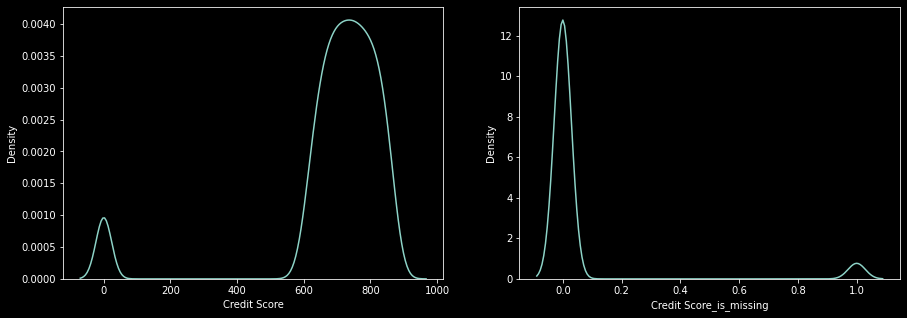

In [65]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.kdeplot(x['Credit Score'])
plt.subplot(1, 2, 2)
sns.kdeplot(x['Credit Score_is_missing']);
x['Credit Score'].corr(x['Credit Score_is_missing'])

(-0.9254610513614733, -0.9254610513614733)

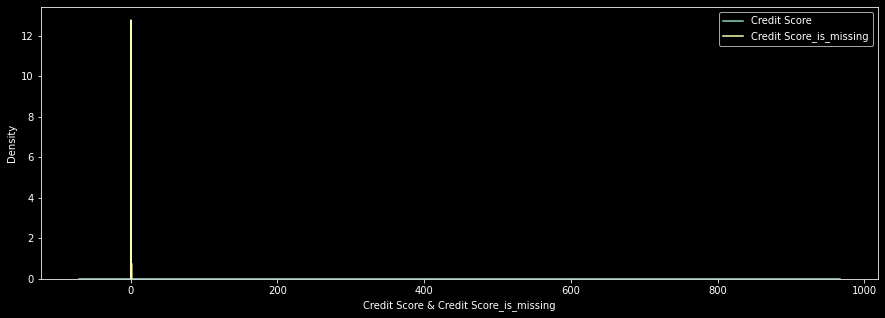

In [66]:
plt.figure(figsize=(15, 5))
# plt.subplot(1, 2, 1)
sns.kdeplot(x['Credit Score'])
# plt.subplot(1, 2, 2)
sns.kdeplot(x['Credit Score_is_missing'])
plt.legend(['Credit Score', 'Credit Score_is_missing'])
plt.xlabel('Credit Score & Credit Score_is_missing');
x['Credit Score'].corr(x['Credit Score_is_missing']), x['Credit Score'].corr(x['Credit Score_is_missing'])

In [18]:
x.drop(columns=['Income Stability_is_missing'], inplace=True)

In [19]:
# Create and run the model
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor()

# Fit the model
model.fit(x, y)

# Check accuracy 
model.score(x, y)

0.9638338099619043

In [20]:
# Split into training and testing dataset
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# Check shape
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((24000, 31), (6000, 31), (24000,), (6000,))

In [21]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score

# Run all model ande comepare all model accuracy
models = {'LinearRegression': LinearRegression(),
          'RandomForestRegressor': RandomForestRegressor(),
          'GradientBoostingRegressor': GradientBoostingRegressor(),
          'KNeighborsRegressor': KNeighborsRegressor(),
          'XGBRegressor': XGBRegressor()}

scores = {}
r2_scores = {}
for name, model in models.items():
    # fit the model 
    model.fit(x_train, y_train)
    # model score
    scores[name] = model.score(x_test, y_test)
    # predict value
    y_pred = model.predict(x_test)
    # check r2_score
    r2_scores[name] = max(0, 100*r2_score(y_test, y_pred))

In [22]:
scores

{'LinearRegression': 0.5795515420671269,
 'RandomForestRegressor': 0.7469063780970551,
 'GradientBoostingRegressor': 0.7390779336739577,
 'KNeighborsRegressor': 0.41766386254952015,
 'XGBRegressor': 0.7420949604249915}

In [23]:
r2_scores

{'LinearRegression': 57.95515420671269,
 'RandomForestRegressor': 74.6906378097055,
 'GradientBoostingRegressor': 73.90779336739577,
 'KNeighborsRegressor': 41.76638625495202,
 'XGBRegressor': 74.20949604249914}

In [24]:
acc = pd.DataFrame(r2_scores, index=[0])
acc

,LinearRegression,RandomForestRegressor,GradientBoostingRegressor,KNeighborsRegressor,XGBRegressor
0,57.955154,74.690638,73.907793,41.766386,74.209496


In [25]:
acc.T

,0
LinearRegression,57.955154
RandomForestRegressor,74.690638
GradientBoostingRegressor,73.907793
KNeighborsRegressor,41.766386
XGBRegressor,74.209496


In [26]:
list(acc.loc[0])

[57.95515420671269,
 74.6906378097055,
 73.90779336739577,
 41.76638625495202,
 74.20949604249914]

In [27]:
# pd.DataFrame(r2_scores, index=['accuracy']).T.plot.bar()
# plt.xticks(rotation=15)
plt.figure(figsize=(10,5))
fig = px.bar(x=acc.columns, y=list(acc.loc[0]), template='none')
fig.show()
fig.write_image('fig/accuracy.svg')

<Figure size 720x360 with 0 Axes>

In [28]:
# Run Gradient Boosting Regressor model on training dataset
gb_model = GradientBoostingRegressor(random_state=42)

gb_model.fit(x_train, y_train)

gb_model.score(x_test, y_test)

0.7386677808125244

In [29]:
# Run Random Forest Regressor model on training dataset
rf_model = RandomForestRegressor(n_jobs=-1, random_state=42, max_samples=10000)

rf_model.fit(x_train, y_train)

rf_model.score(x_test, y_test)

0.751354254476412

In [30]:
from sklearn.model_selection import RandomizedSearchCV

# Diffrent RandomForestRegressor hyperparametes
rf_grid = {'n_estimators': np.arange(10, 100, 10),
           'max_depth': [None, 3, 5, 10],
           'min_samples_split': np.arange(2, 20, 2), 
           'min_samples_leaf': np.arange(1, 20, 2),
           'max_features': [0.5, 1, 'sqrt', 'auto'],
           'max_samples': [10000]}

# Instantiate RandomizedSearchCV model
rs_model = RandomizedSearchCV(RandomForestRegressor(n_jobs=-1, random_state=42),
                              param_distributions=rf_grid,
                              n_iter=20,
                              n_jobs=-1,
                              cv=5,
                              verbose=True)

# Fit the RandomizedSearchCV model
rs_model.fit(x_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5,
                   estimator=RandomForestRegressor(n_jobs=-1, random_state=42),
                   n_iter=20, n_jobs=-1,
                   param_distributions={'max_depth': [None, 3, 5, 10],
                                        'max_features': [0.5, 1, 'sqrt',
                                                         'auto'],
                                        'max_samples': [10000],
                                        'min_samples_leaf': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19]),
                                        'min_samples_split': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18]),
                                        'n_estimators': array([10, 20, 30, 40, 50, 60, 70, 80, 90])},
                   verbose=True)

In [31]:
rs_model.best_score_

0.7438757051660938

In [32]:
rs_model.best_params_

{'n_estimators': 40,
 'min_samples_split': 18,
 'min_samples_leaf': 1,
 'max_samples': 10000,
 'max_features': 0.5,
 'max_depth': 10}

In [33]:
ideal_model =  RandomForestRegressor(n_estimators=40,
                                     max_depth=10,
                                     min_samples_split=18,
                                     min_samples_leaf=1,
                                     n_jobs=-1,
                                     random_state=42,
                                     max_samples=10000,
                                     max_features=0.5)

ideal_model.fit(x_train, y_train)

ideal_model.score(x_test, y_test)

0.7522801462375872

## Load test dataset and set as per `x_train` dataset

In [34]:
test_data = pd.read_csv('test.csv', na_values=['?'])
test_data.head().T

,0,1,2,3,4
Customer ID,C-26247,C-35067,C-34590,C-16668,C-12196
Name,Tandra Olszewski,Jeannette Cha,Keva Godfrey,Elva Sackett,Sade Constable
Gender,F,F,F,M,F
Age,47,57,52,65,60
Income (USD),3472.69,1184.84,1266.27,1369.72,1939.23
Income Stability,Low,Low,Low,High,High
Profession,Commercial associate,Working,Working,Pensioner,Pensioner
Type of Employment,Managers,Sales staff,NaN,NaN,NaN
Location,Semi-Urban,Rural,Semi-Urban,Rural,Urban
Loan Amount Request (USD),137088.98,104771.59,176684.91,97009.18,109980.0


In [35]:
def test_data_set_as_per_train_data(data, fillvalue=0):
    
    '''
    data = dataframe name
    fillvalue = fill null values in numeric columns {'mean', 'median', 0}
                'mean' = filled by mean values in that perticular column
                'median' = filled by median values in that perticular column
                0 = filled by 0(zero) which is default value
    '''
    
    # Drop columns we don't use in ML
    data.drop(columns=['Customer ID', 'Name', 'Gender', 'Expense Type 2', 'Has Active Credit Card', 
                       'Property Age', 'Property Location'], inplace=True)
    
    # for numeric columns
    for label, content in data.items():
        if pd.api.types.is_numeric_dtype(content):
            # Add Binary column to indicate wherether missing values is present or not
            data[label+'_is_missing'] = pd.isnull(content)
            if pd.isnull(content).sum():
                # Fill null values
                if fillvalue=='mean':
                    data[label] = content.fillna(content.mean())
                elif fillvalue=='median':
                    data[label] = content.fillna(content.median())
                else:
                    data[label].fillna(value=0, inplace=True)
                
    # for string columns
    for label, content in data.items():
        if pd.api.types.is_string_dtype(content):
            # Add Binary column to indicate wherether missing values is present or not
            data[label+'_is_missing'] = pd.isnull(content)
            # Turn into categorical dtype
            data[label] = content.astype('category').cat.as_ordered()
            # Turn into numeric type and add +1
            data[label] = pd.Categorical(content).codes + 1
            
    # drop column
    data.drop(columns=['Income Stability_is_missing'], inplace=True)

In [36]:
df_test = test_data.copy()

In [37]:
test_data_set_as_per_train_data(df_test, 'median')
df_test.columns == x_train.columns

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True])

In [38]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 31 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Age                                     20000 non-null  int64  
 1   Income (USD)                            20000 non-null  float64
 2   Income Stability                        20000 non-null  int8   
 3   Profession                              20000 non-null  int8   
 4   Type of Employment                      20000 non-null  int8   
 5   Location                                20000 non-null  int8   
 6   Loan Amount Request (USD)               20000 non-null  float64
 7   Current Loan Expenses (USD)             20000 non-null  float64
 8   Expense Type 1                          20000 non-null  int8   
 9   Dependents                              20000 non-null  float64
 10  Credit Score                            20000 non-null  fl

In [39]:
# Fit all train data in to ideal_model
#ideal_model.fit(x, y)

y_pred = ideal_model.predict(df_test)
y_pred

array([86409.42354329, 62289.89212397, 13458.91331827, ...,
        1452.43780647, 67979.9791464 , 59535.14468906])

In [40]:
df_pred = pd.DataFrame(test_data['Customer ID'])
df_pred['Loan Sanction Amount (USD)'] = np.round(y_pred, 2)
df_pred

,Customer ID,Loan Sanction Amount (USD)
0,C-26247,86409.42
1,C-35067,62289.89
2,C-34590,13458.91
3,C-16668,53517.69
4,C-12196,69262.23
...,...,...
19995,C-9076,92151.19
19996,C-17587,30552.90
19997,C-46479,1452.44
19998,C-3099,67979.98


In [41]:
df_pred.to_csv('my_output.csv', index=False)